In [1]:
import pandas as pd
import numpy as np

import matplotlib as plt
import matplotlib.pyplot as plt

import seaborn as sns

%matplotlib inline

df = pd.read_csv('processed_data/iteration_metrics_cleaned.csv')
df.columns

Index(['project', 'sprint.name', 'issues', 'velocity', 'work_capacity',
       'sprint.startDate', 'sprint.endDate', 'storypoints', 'sprint_length',
       'focus_factor', 'fields.assignee.name', 'old_devs', 'old_devs_abs',
       'new_devs_abs', 'turnover_abs', 'current_devs_abs', 'turnover',
       'new_devs', 'sprint.nbr', 'TSI', 'TSI_inv', 'individual_velocity',
       'sprint.key'],
      dtype='object')

In [2]:
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica'], 'size':10})
rc('text', usetex=False)

import seaborn as sns
sns.set_context('talk',font_scale=.8)

# Describe

## Focus factor

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


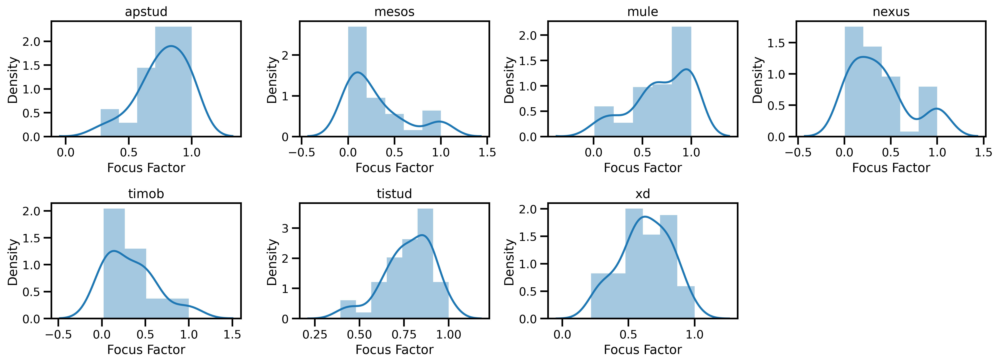

In [3]:
fig = plt.figure(figsize=(16,6), dpi=300)

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='focus_factor')

i=0
for p in dfx.columns:
    i = i + 1
    ax = fig.add_subplot(2, 4, i)
    
    x = dfx.loc[:, p].dropna()#.rolling(2).mean().plot(style='-o', label='mean', ylim=(0, 1), ax=ax)
    
    sns.distplot(x)
    
    #ax.axhline(y=.7, linestyle='--', alpha=.6)
    #ax.axhline(y=.9, linestyle='--', alpha=.6)

    ax.set_xlabel('Focus Factor')
    ax.set_ylabel('Density')

    ax.set_title(p)
    #ax[i].legend(loc='lower left', frameon=False)
    
plt.tight_layout()
plt.savefig('img/focus_factor_dist.png')

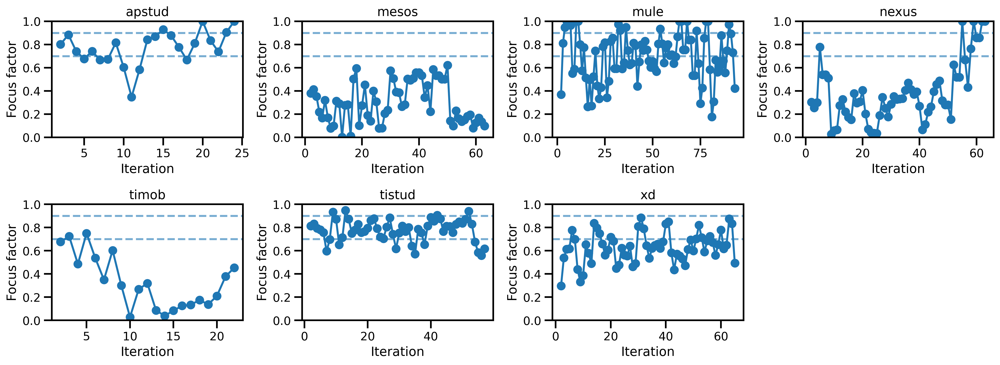

In [4]:
fig = plt.figure(figsize=(16,6), dpi=300)

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='focus_factor')

i=0
for p in dfx.columns:
    i = i + 1
    ax = fig.add_subplot(2, 4, i)
    
    dfx.loc[:, p].dropna().rolling(2).mean().plot(style='-o', label='mean', ylim=(0, 1), ax=ax)
    
    ax.axhline(y=.7, linestyle='--', alpha=.6)
    ax.axhline(y=.9, linestyle='--', alpha=.6)

    ax.set_xlabel('Iteration')
    ax.set_ylabel('Focus factor')

    ax.set_title(p)
    
plt.tight_layout()
plt.savefig('img/focus_factor_all.png')

## individual velocity

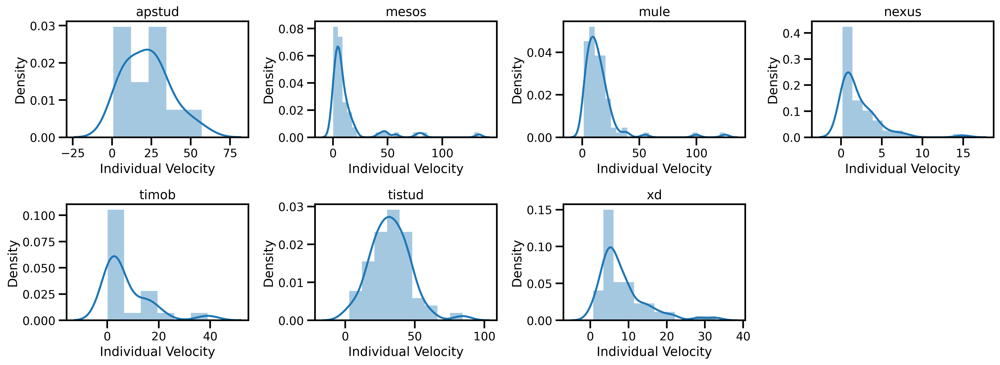

In [5]:
fig = plt.figure(figsize=(16,6), dpi=300)

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='individual_velocity')

i=0
for p in dfx.columns:
    i = i + 1
    ax = fig.add_subplot(2, 4, i)
    
    x = dfx.loc[:, p].dropna()#.rolling(2).mean().plot(style='-o', label='mean', ylim=(0, 1), ax=ax)
    
    sns.distplot(x)
    
    #ax.axhline(y=.7, linestyle='--', alpha=.6)
    #ax.axhline(y=.9, linestyle='--', alpha=.6)

    ax.set_xlabel('Individual Velocity')
    ax.set_ylabel('Density')

    ax.set_title(p)
    #ax[i].legend(loc='lower left', frameon=False)
    
plt.tight_layout()
plt.savefig('img/individual_velocity_dist.png')

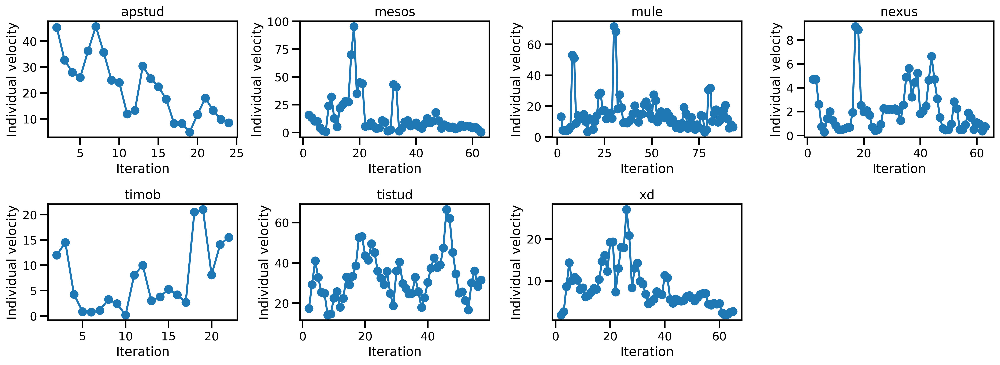

In [6]:
fig = plt.figure(figsize=(16,6), dpi=300)

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='individual_velocity')

i=0
for p in dfx.columns:
    i = i + 1
    ax = fig.add_subplot(2, 4, i)
    
    dfx.loc[:, p].dropna().rolling(2).mean().plot(style='-o', label='mean', ax=ax)

    ax.set_xlabel('Iteration')
    ax.set_ylabel('Individual velocity')

    ax.set_title(p)
    #ax[i].legend(loc='lower left', frameon=False)
    
plt.tight_layout()
plt.savefig('img/individual_velocity_all.png')

In [7]:
# from the figure, it is clear that mesos has a weird data point around 400 story points.
df = df[df['individual_velocity'] < 300]

## normality check of individual velocity

apstud The null hypothesis cannot be rejected -- normal
mesos The null hypothesis can be rejected -- not normal
  Using log(x):  mesos* The null hypothesis cannot be rejected -- normal
mule The null hypothesis can be rejected -- not normal
  Using log(x):  mule* The null hypothesis cannot be rejected -- normal
nexus The null hypothesis can be rejected -- not normal
  Using log(x):  nexus* The null hypothesis cannot be rejected -- normal
timob The null hypothesis can be rejected -- not normal
  Using log(x):  timob* The null hypothesis cannot be rejected -- normal
tistud The null hypothesis cannot be rejected -- normal
xd The null hypothesis can be rejected -- not normal
  Using log(x):  xd* The null hypothesis cannot be rejected -- normal


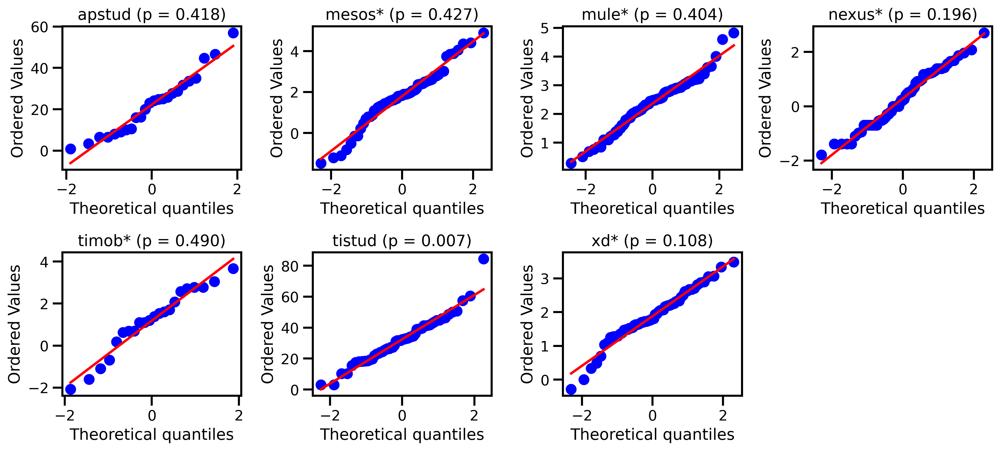

In [8]:
import seaborn as sns
from scipy import stats

fig = plt.figure(figsize=(13,6), dpi=300)

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='individual_velocity')

#df = df[df['individual_velocity'] < 300]

i=0
for p in dfx.columns:
    i = i + 1
    ax = fig.add_subplot(2, 4, i)
    
    x = dfx.loc[:, p].dropna()
    
    k2, pv = stats.normaltest(x)
    alpha = 1e-3

    if pv < alpha:  # null hypothesis: x comes from a normal distribution
        print(p, "The null hypothesis can be rejected -- not normal")
        x = np.log(x)
        p = p+'*'
        k2, pv = stats.normaltest(x)
        if pv < alpha:  # null hypothesis: x comes from a normal distribution
            print("  Using log(x): ", p, "The null hypothesis can be rejected -- not normal")
        else:
            print("  Using log(x): ", p, "The null hypothesis cannot be rejected -- normal")
    else:
        print(p, "The null hypothesis cannot be rejected -- normal")
        
    
    stats.probplot(x, plot=plt)
    
    title = "{:} (p < .001)".format(p) if pv < .001 else "{:} (p = {:.3f})".format(p, pv)

    ax.set_title(title)
    
    #ax.set_xlabel('Iteration')
    #ax.set_ylabel('Individual velocity')
   
    #ax[i].legend(loc='lower left', frameon=False)
    
plt.tight_layout()
plt.savefig('img/individual_velocity_normalitycheck.png')

In conclusion, 
* APSTUD, TISTUD have normal distributions
* The rest have not but they can be transformed by applying log().

## normality check of focus factor

apstud The null hypothesis cannot be rejected -- normal
mesos The null hypothesis cannot be rejected -- normal
mule The null hypothesis cannot be rejected -- normal
nexus The null hypothesis cannot be rejected -- normal
timob The null hypothesis cannot be rejected -- normal
tistud The null hypothesis cannot be rejected -- normal
xd The null hypothesis cannot be rejected -- normal


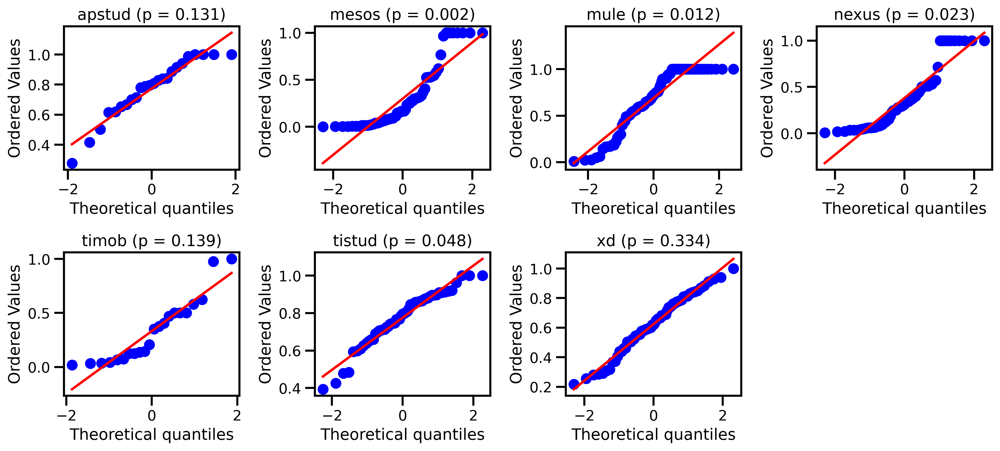

In [9]:
import seaborn as sns
from scipy import stats

fig = plt.figure(figsize=(13,6), dpi=300)

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='focus_factor')

i=0
for p in dfx.columns:
    i = i + 1
    ax = fig.add_subplot(2, 4, i)
    
    x = dfx.loc[:, p].dropna()
    
    k2, pv = stats.normaltest(x)
    alpha = 1e-3

    if pv < alpha:  # null hypothesis: x comes from a normal distribution
        print(p, "The null hypothesis can be rejected -- not normal")
    else:
        print(p, "The null hypothesis cannot be rejected -- normal")
    
    stats.probplot(x, plot=plt)
    
    title = "{:} (p < .001)".format(p) if pv < .001 else "{:} (p = {:.3f})".format(p, pv)
    
    ax.set_title(title)
    
    #ax.set_xlabel('Iteration')
    #ax.set_ylabel('Individual velocity')
   
    #ax[i].legend(loc='lower left', frameon=False)
    
plt.tight_layout()
plt.savefig('img/focus_factor_normalitycheck.png')

DNN is not normal, so it is removed.

In [10]:
df = df[~df['project'].isin(['dnn'])]

# Contextual factors

* turnover (leavers)
* turnover (newcomers)
* TSI
* sprint lenght

In [11]:
df.head(3)

,project,sprint.name,issues,velocity,work_capacity,sprint.startDate,sprint.endDate,storypoints,sprint_length,focus_factor,...,new_devs_abs,turnover_abs,current_devs_abs,turnover,new_devs,sprint.nbr,TSI,TSI_inv,individual_velocity,sprint.key
0,apstud,2012 Sprint 03,23,228.0,371.0,2012-01-27 00:00:00+00:00,2012-02-10 00:00:00+00:00,233.0,14.0,0.614555,...,1.0,0.0,4,0.000000,0.285714,1.0,1.333333,0.75,57.00,apstud_2012 Sprint 03
1,apstud,2012 Sprint 04,18,168.0,170.0,2012-02-10 00:00:00+00:00,2012-02-24 00:00:00+00:00,201.0,14.0,0.988235,...,1.0,0.0,5,0.000000,0.222222,2.0,1.333333,0.75,33.60,apstud_2012 Sprint 04
2,apstud,2012 Sprint 05,19,127.0,163.0,2012-02-24 00:00:00+00:00,2012-03-09 00:00:00+00:00,148.0,14.0,0.779141,...,0.0,1.0,4,0.222222,0.000000,3.0,1.333333,0.75,31.75,apstud_2012 Sprint 05


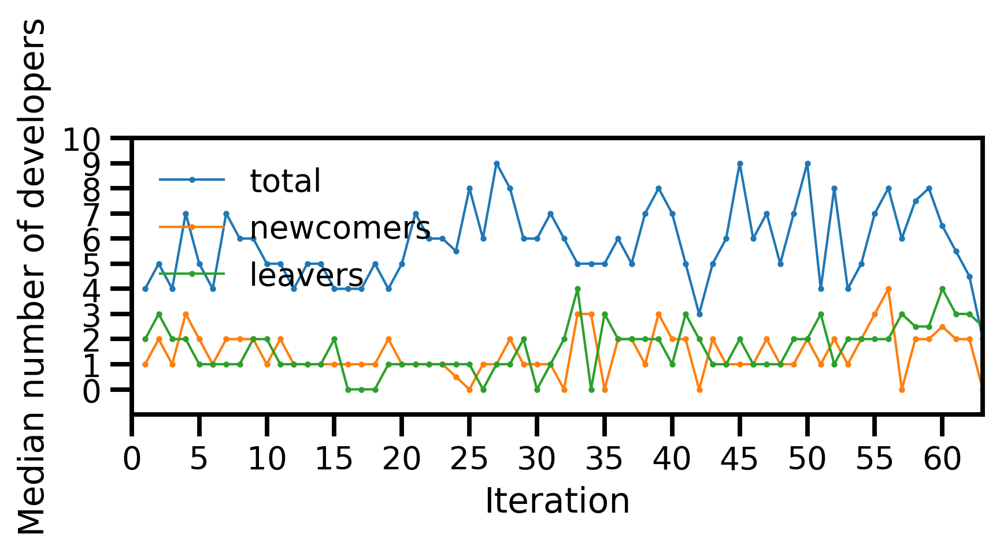

In [12]:
dfx = df.pivot_table(index='sprint.nbr', columns='project', values=['turnover_abs', 'new_devs_abs', 'current_devs_abs'])

fig = plt.figure(figsize=(6,3), dpi=300)
ax = fig.add_subplot(1, 1, 1)

x = dfx.median(axis=1, level=0)

# 63 is the median
x.plot(style='o-', linewidth=1, markersize=1.5, xlim=(0,63), ylim=(-1,10), ax=ax)

ax.set_xlabel('Iteration')
ax.set_ylabel('Median number of developers')

ax.legend(labels=['total', 'newcomers', 'leavers'], loc='upper left', frameon=False)

plt.yticks(np.arange(0, 11, 1.0))
plt.xticks(np.arange(0, 64, 5.0))

plt.tight_layout()

plt.savefig('img/newcomers_vs_leavers.png')

In [13]:
dfx = df.pivot_table(index='sprint.nbr', columns='project', values=['turnover_abs', 'new_devs_abs', 'velocity'])

In [14]:
dfx2 = dfx.swaplevel(axis=1)

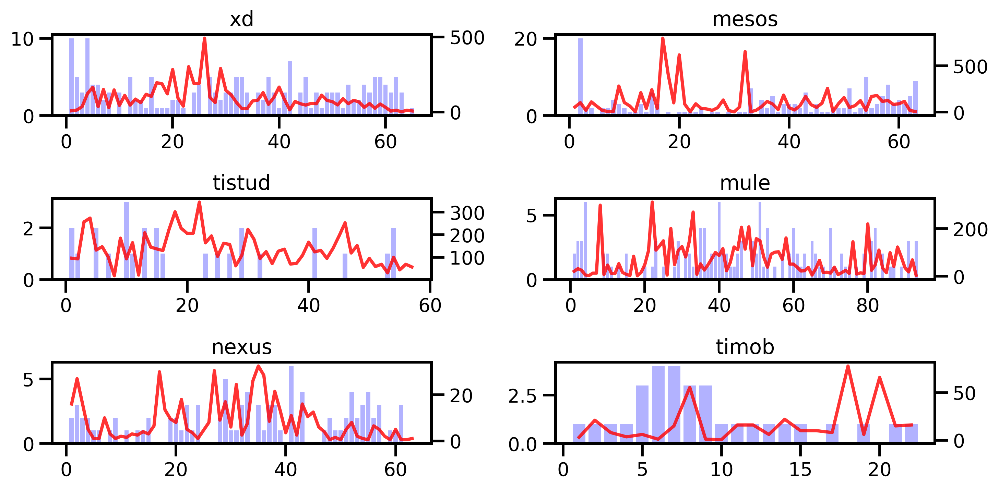

In [15]:
fig = plt.figure(figsize=(10,5), dpi=300)

i=0
for p in ['xd', 'mesos', 'tistud', 'mule', 'nexus', 'timob']:
    i = i + 1
    ax = fig.add_subplot(3, 2, i)
    
    data = dfx2.loc[:, p].dropna()

    ax.bar(data.index, data['turnover_abs'], color='blue', alpha=0.3)
    #ax.bar(data.index, data['new_devs_abs'], color='green', alpha=0.3)
    
    ax2 = ax.twinx()
    
    ax2.plot(data['velocity'], color='red', alpha=0.8)
    
    #ax.set_xlabel('Iteration')
    #ax.set_ylabel('Individual velocity')

    ax.set_title(p)
    #ax[i].legend(loc='lower left', frameon=False)
    
plt.tight_layout()

# Individual velocity

## individual chart

In [41]:
dfx = df.pivot_table(index='sprint.nbr', columns='project', values='individual_velocity')

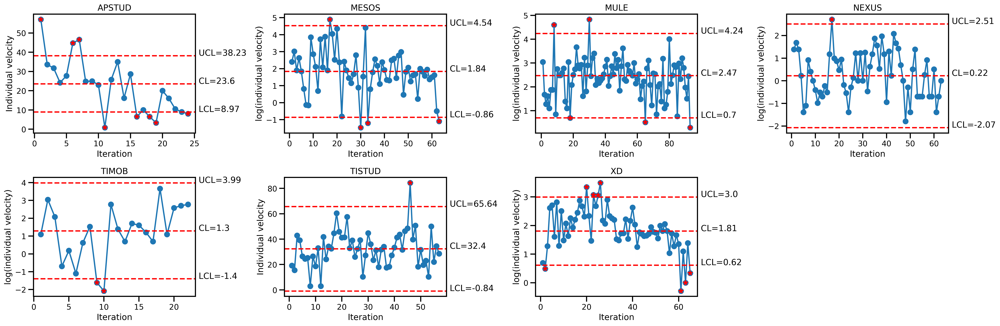

In [48]:
import numpy as np

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='individual_velocity')

fig = plt.figure(figsize=(24,8), dpi=300)

i=0
for p in dfx.columns:
    i = i + 1
    
    ax = fig.add_subplot(2, 4, i)
    if p in ['apstud', 'tistud']:
        x = dfx.loc[:, p].dropna()
        y_label = "Individual velocity"
    else: #     ['mesos', 'mule', 'nexus', 'timob', 'xd']
        x = np.log(dfx.loc[:, p].dropna())
        y_label = "log(individual velocity)"
    
    subgroups = 2
    xbar = x.median()
    
    R = np.abs(x - x.shift(-1))
    meanR = R.median()
    
    # individiual control chart
    d2 = 1.128
    xUCL = xbar + 3*meanR/d2
    xLCL = xbar - 3*meanR/d2
    xCL = xbar

    #xLCL = xLCL if xLCL >= 0 else 0

    x.plot(style='-o', label='mean', ax=ax)

    ax.axhline(y=xCL, linestyle='--', color='red', label='MR')
    ax.annotate('    CL=' + str(round(xCL,2)), xy=(len(R), xCL), xycoords='data', textcoords='data')
    
    ax.axhline(y=xUCL, linestyle='--', color='red', label='UCL')
    ax.annotate('    UCL=' + str(round(xUCL,2)), xy=(len(R), xUCL), xycoords='data', textcoords='data') 

    ax.axhline(y=xLCL, linestyle='--', color='red', label='LCL')
    ax.annotate('    LCL=' + str(round(xLCL,2)), xy=(len(R), xLCL), xycoords='data', textcoords='data')
    
    #dfx.loc[ dfx[p] > xUCL, p].dropna().plot(style='-o', color='red', label='mean', ax=ax)
    
    plt.plot(x[x > xUCL].index, x[x > xUCL], 'r*')
    plt.plot(x[x < xLCL].index, x[x < xLCL], 'r*')
    
    ax.set_xlabel('Iteration')
    ax.set_ylabel(y_label)

    ax.set_title(p.upper())
    #ax[i].legend(loc='lower left', frameon=False)
    
plt.tight_layout()
plt.savefig('img/I_chart_individual_velocity.pdf')

## MR charts

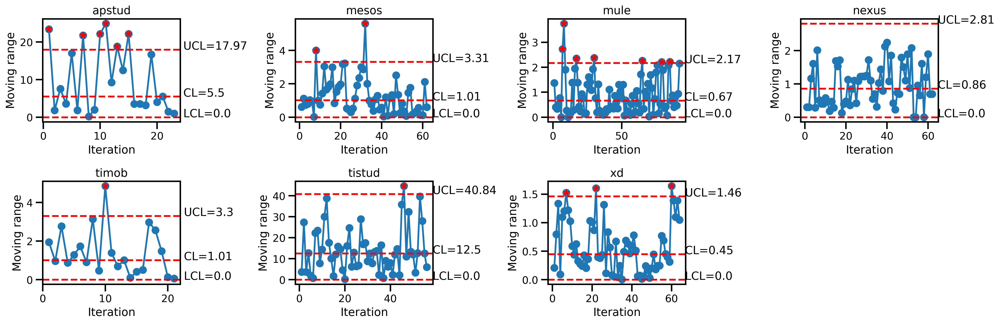

In [18]:
import numpy as np

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='individual_velocity')

fig = plt.figure(figsize=(18,6), dpi=300)

i=0
for p in dfx.columns:
    i = i + 1
    
    ax = fig.add_subplot(2, 4, i)

    if p in ['apstud', 'tistud']:
        x = dfx.loc[:, p].dropna()
        y_label = "Moving range"
    else: 
        x = np.log(dfx.loc[:, p].dropna())
        y_label = "Moving range"
    
    subgroups = 2
    xbar = x.median()
    
    R = np.abs(x - x.shift(-1))
    meanR = R.median()
    
    # ranges
    D3 = 0
    D4 = 3.267
    rUCL = D4*meanR 
    rLCL = D3*meanR
    rCL = meanR

    R.plot(style='-o', label='mean', ax=ax)

    ax.axhline(y=rCL, linestyle='--', color='red', label='MR')
    ax.annotate(' CL=' + str(round(rCL,2)), xy=(len(R), rCL), xycoords='data', textcoords='data')
    
    ax.axhline(y=rUCL, linestyle='--', color='red', label='UCL')
    ax.annotate(' UCL=' + str(round(rUCL,2)), xy=(len(R), rUCL), xycoords='data', textcoords='data')

    ax.axhline(y=rLCL, linestyle='--', color='red', label='LCL')
    ax.annotate(' LCL=' + str(round(rLCL,2)), xy=(len(R), rLCL), xycoords='data', textcoords='data')

    rLCL = rLCL if rLCL >= 0 else 0
    
    #dfx.loc[ dfx[p] > xUCL, p].dropna().plot(style='-o', color='red', label='mean', ax=ax)
    
    plt.plot(R[R > rUCL].index, R[R > rUCL], 'r*')
    plt.plot(R[R < rLCL].index, R[R < rLCL], 'r*')
    
    ax.set_xlabel('Iteration')
    ax.set_ylabel(y_label)

    ax.set_title(p)
    
plt.tight_layout()
plt.savefig('img/MR_individual_velocity.png')

## I-MR charts

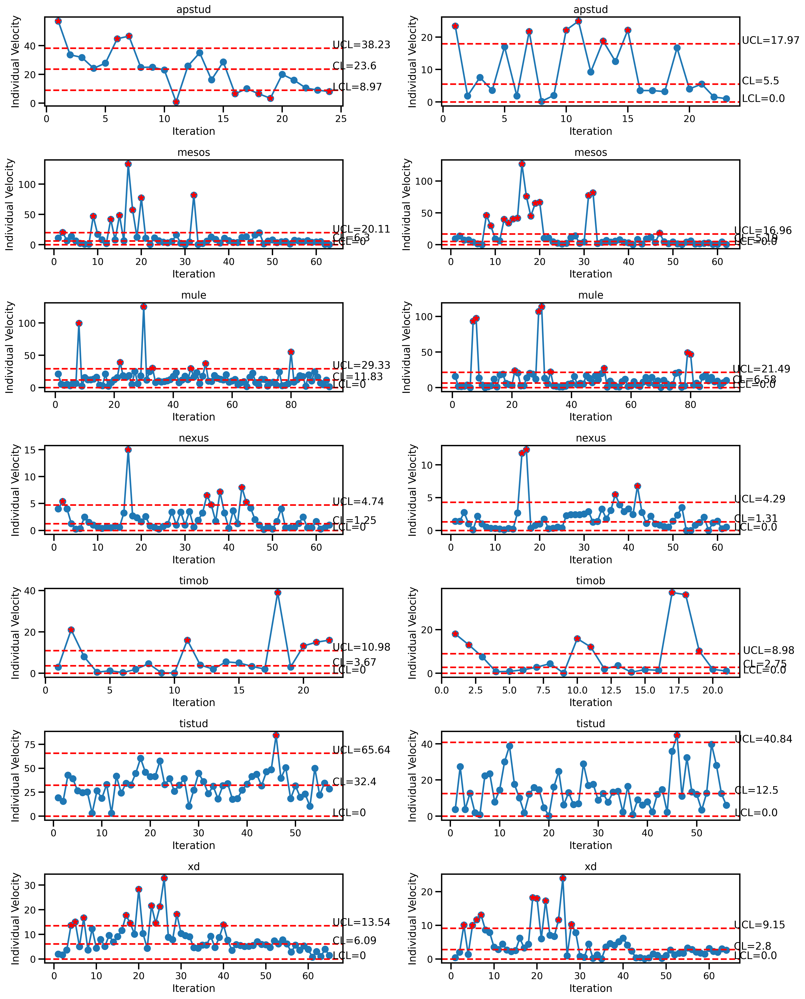

In [19]:
import numpy as np

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='individual_velocity')

fig = plt.figure(figsize=(16,22), dpi=300)

i=0
for p in dfx.columns:
    x = dfx.loc[:, p].dropna()
    
    subgroups = 2
    xbar = x.median()
    
    R = np.abs(x - x.shift(-1))
    meanR = R.median()
    
    ######################################
    # I chart
    i = i + 1
    ax = fig.add_subplot(8, 2, i)
    
    # individiual control chart
    d2 = 1.128
    xUCL = xbar + 3*meanR/d2
    xLCL = xbar - 3*meanR/d2
    xCL = xbar

    xLCL = xLCL if xLCL >= 0 else 0

    x.plot(style='-o', label='mean', ax=ax)

    ax.axhline(y=xCL, linestyle='--', color='red', label='MR')
    ax.annotate(' CL=' + str(round(xCL,2)), xy=(len(R), xCL), xycoords='data', textcoords='data')
    
    ax.axhline(y=xUCL, linestyle='--', color='red', label='UCL')
    ax.annotate(' UCL=' + str(round(xUCL,2)), xy=(len(R), xUCL), xycoords='data', textcoords='data')

    ax.axhline(y=xLCL, linestyle='--', color='red', label='LCL')
    ax.annotate(' LCL=' + str(round(xLCL,2)), xy=(len(R), xLCL), xycoords='data', textcoords='data')
    
    #dfx.loc[ dfx[p] > xUCL, p].dropna().plot(style='-o', color='red', label='mean', ax=ax)
    
    plt.plot(dfx.loc[ dfx[p] > xUCL, p].index, dfx.loc[ dfx[p] > xUCL, p], 'r*')
    plt.plot(dfx.loc[ dfx[p] < xLCL, p].index, dfx.loc[ dfx[p] < xLCL, p], 'r*')
    
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Individual Velocity')

    ax.set_title(p)
    
    #######################################
    # MR chart
    i = i + 1
    ax = fig.add_subplot(8, 2, i)
    
    # ranges
    D3 = 0
    D4 = 3.267
    rUCL = D4*meanR 
    rLCL = D3*meanR
    rCL = meanR

    R.plot(style='-o', label='mean', ax=ax)

    ax.axhline(y=rCL, linestyle='--', color='red', label='MR')
    ax.annotate(' CL=' + str(round(rCL,2)), xy=(len(R), rCL), xycoords='data', textcoords='data')
    
    ax.axhline(y=rUCL, linestyle='--', color='red', label='UCL')
    ax.annotate(' UCL=' + str(round(rUCL,2)), xy=(len(R), rUCL), xycoords='data', textcoords='data')

    ax.axhline(y=rLCL, linestyle='--', color='red', label='LCL')
    ax.annotate(' LCL=' + str(round(rLCL,2)), xy=(len(R), rLCL), xycoords='data', textcoords='data')

    rLCL = rLCL if rLCL >= 0 else 0
    
    #dfx.loc[ dfx[p] > xUCL, p].dropna().plot(style='-o', color='red', label='mean', ax=ax)
    
    plt.plot(R[R > rUCL].index, R[R > rUCL], 'r*')
    plt.plot(R[R < rLCL].index, R[R < rLCL], 'r*')
    
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Individual Velocity')

    ax.set_title(p)

plt.tight_layout()
plt.savefig('img/I-MR_individual_velocity.png')

# focus factor

## individual chart

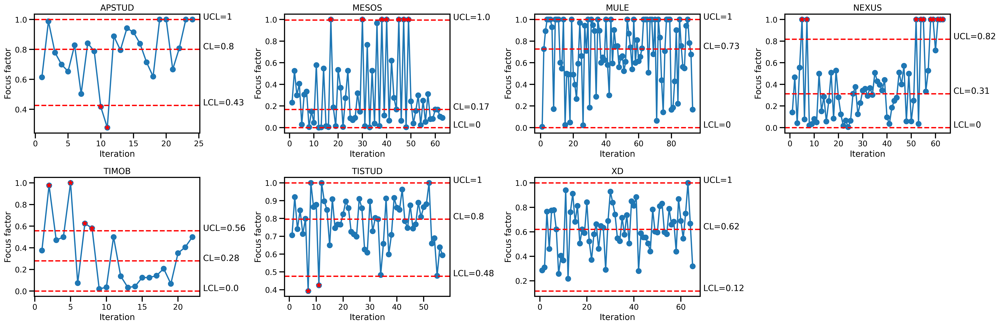

In [101]:
dfx = df.pivot_table(index='sprint.nbr', columns='project', values='focus_factor')

fig = plt.figure(figsize=(24,8), dpi=300)

i=0
for p in dfx.columns:
    i = i + 1
    
    ax = fig.add_subplot(2, 4, i)
    
    x = dfx.loc[:, p].dropna()
    R = np.abs(x - x.shift(-1))
    meanR = R.median()
    
    xbar = x.median()
    
    # individiual control chart
    d2 = 1.128
    xUCL = xbar + 3*meanR/d2
    xLCL = xbar - 3*meanR/d2
    xCL = xbar

    xLCL = xLCL if xLCL >= 0 else 0
    xUCL = xUCL if xUCL <= 1 else 1

    x.plot(style='-o', label='mean', ax=ax)

    ax.axhline(y=xCL, linestyle='--', color='red', label='MR')
    ax.annotate('    CL=' + str(round(xCL,2)), xy=(len(R), xCL), xycoords='data', textcoords='data')
    
    ax.axhline(y=xUCL, linestyle='--', color='red', label='UCL')
    ax.annotate('    UCL=' + str(round(xUCL,2)), xy=(len(R), xUCL), xycoords='data', textcoords='data')

    ax.axhline(y=xLCL, linestyle='--', color='red', label='LCL')
    ax.annotate('    LCL=' + str(round(xLCL,2)), xy=(len(R), xLCL), xycoords='data', textcoords='data')
    
    # plot out of control
    plt.plot(dfx.loc[ dfx[p] > xUCL, p].index, dfx.loc[ dfx[p] > xUCL, p], 'r*')
    plt.plot(dfx.loc[ dfx[p] < xLCL, p].index, dfx.loc[ dfx[p] < xLCL, p], 'r*')
    
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Focus factor')

    ax.set_title(p.upper())
    
plt.tight_layout()
plt.savefig('img/I_chart_focus_factor.pdf')

## MR chart

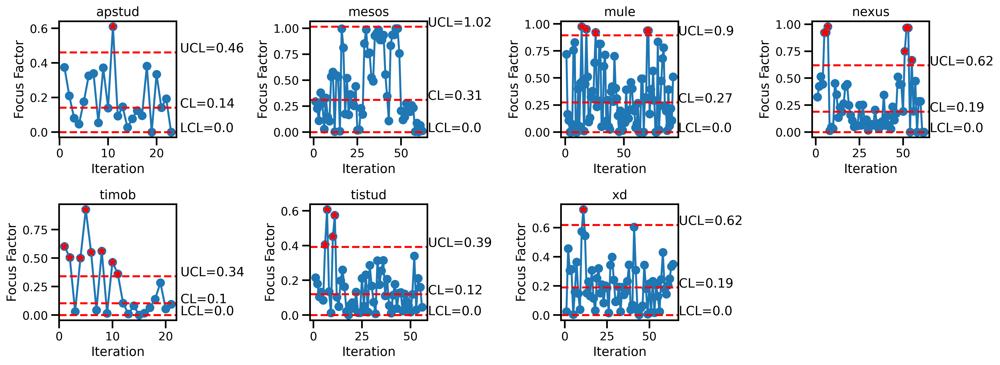

In [21]:
import numpy as np

dfx = df.pivot_table(index='sprint.nbr', columns='project', values='focus_factor')

fig = plt.figure(figsize=(16,6), dpi=300)

i=0
for p in dfx.columns:
    i = i + 1
    
    ax = fig.add_subplot(2, 4, i)
    
    x = dfx.loc[:, p].dropna()
    
    subgroups = 2
    xbar = x.median()
    
    R = np.abs(x - x.shift(-1))
    #R = R.iloc[::2]
    meanR = R.median()
    
    # ranges
    D3 = 0
    D4 = 3.267
    rUCL = D4*meanR 
    rLCL = D3*meanR
    rCL = meanR

    R.plot(style='-o', label='mean', ax=ax)

    ax.axhline(y=rCL, linestyle='--', color='red', label='MR')
    ax.annotate(' CL=' + str(round(rCL,2)), xy=(len(R), rCL), xycoords='data', textcoords='data')
    
    ax.axhline(y=rUCL, linestyle='--', color='red', label='UCL')
    ax.annotate(' UCL=' + str(round(rUCL,2)), xy=(len(R), rUCL), xycoords='data', textcoords='data')

    ax.axhline(y=rLCL, linestyle='--', color='red', label='LCL')
    ax.annotate(' LCL=' + str(round(rLCL,2)), xy=(len(R), rLCL), xycoords='data', textcoords='data')


    rLCL = rLCL if rLCL >= 0 else 0
    
    #dfx.loc[ dfx[p] > xUCL, p].dropna().plot(style='-o', color='red', label='mean', ax=ax)
    
    plt.plot(R[R > rUCL].index, R[R > rUCL], 'r*')
    plt.plot(R[R < rLCL].index, R[R < rLCL], 'r*')
    
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Focus Factor')

    ax.set_title(p)
    #ax[i].legend(loc='lower left', frameon=False)
    
plt.tight_layout()
plt.savefig('img/MR_focus_factor.png')

# zones

In [22]:
def classif(x, m, meanR):
    d2 = 1.128
    if x > xbar + 3*meanR/d2:
        return 'D+'
    elif x > xbar + 2*meanR/d2:
        return 'C+'
    elif x > xbar + 1*meanR/d2:
        return 'B+'
    elif x > m:
        return 'A+'
    elif x > xbar - 1*meanR/d2:
        return 'A-'
    elif x > xbar - 2*meanR/d2:
        return 'B-'
    elif x > xbar - 3*meanR/d2:
        return 'C-'
    else:
        return 'D-'

In [50]:
for p in df['project'].unique():
    dfx = df[df['project'] == p]
    
    if p in ['apstud', 'tistud']:
        x = dfx.loc[:, 'individual_velocity'].dropna()
        y_label = "Individual velocity"
    else: 
        x = np.log(dfx.loc[:, 'individual_velocity'].dropna())
        y_label = "log(individual velocity)"
    
    subgroups = 2
    xbar = x.median()
    
    R = np.abs(x - x.shift(-1))
    meanR = R.median()
    
    # individiual control chart
    d2 = 1.128
    xUCL = xbar + 3*meanR/d2
    xLCL = xbar - 3*meanR/d2
    xCL = xbar
    
    zone_D_pos = x[x >= xUCL].index
    zone_D_neg = x[x <= xLCL].index
    
    print(p, zone_D_pos.values, zone_D_neg.values)
    
    sigma = (x - xbar) * d2 / meanR
    
    df.loc[dfx.index, 'sigma_velocity'] = x.apply(lambda e : (e - xbar) * d2 / meanR )

apstud [0 5 6] [10 15 17 18 23]
mesos [40] [53 56 86]
mule [ 94 116] [104 151 179]
nexus [196] []
timob [] [251 252]
tistud [310] []
xd [341 344 346 347] [323 382 384 386]


In [99]:
for p in df['project'].unique():
    dfx = df[df['project'] == p]
    
    x = dfx.loc[:, 'focus_factor'].dropna()
    
    subgroups = 2
    xbar = x.median()
    
    R = np.abs(x - x.shift(-1))
    meanR = R.median()
    
    # individiual control chart
    d2 = 1.128
    xUCL = xbar + 3*meanR/d2
    xLCL = xbar - 3*meanR/d2
    xCL = xbar
    
    #xUCL = 1 if xUCL > 1 else xUCL
    #xLCL = 0 if xLCL < 0 else xLCL
    
    zone_D_pos = x[x >= xUCL].index
    zone_D_neg = x[x <= xLCL].index
        
    print(p, zone_D_pos.values, zone_D_neg.values)
    
    sigma = (x - xbar) * d2 / meanR
    
    df.loc[dfx.index, 'sigma_focusfactor'] = x.apply(lambda e : (e - xbar) * d2 / meanR )

apstud [] [ 9 10]
mesos [40 53 61 63 68 70 72] []
mule [] []
nexus [184 186 231 233 234 237 238 240 241 242] []
timob [244 247 249 250] []
tistud [] [271 275]
xd [] []


In [66]:
df['zone_velocity'] = df['sigma_velocity'].apply( lambda x : 'D+' if x > 3 else 'D-' if x < -3 else 'N')
df['zone_focusfactor'] = df['sigma_focusfactor'].apply( lambda x : 'D+' if x > 3 else 'D-' if x < -3 else 'N')

In [67]:
df.to_csv('processed_data/metrics_iterations_with_zones.csv', index=False, encoding='utf-8')

In [100]:
df.groupby('project')['zone_focusfactor'].value_counts()

project  zone_focusfactor
apstud   N                   22
         D-                   2
mesos    N                   56
         D+                   7
mule     N                   93
nexus    N                   53
         D+                  10
timob    N                   18
         D+                   4
tistud   N                   55
         D-                   2
xd       N                   65
Name: zone_focusfactor, dtype: int64

# summary

In [90]:
df.head(3)

,project,sprint.name,issues,velocity,work_capacity,sprint.startDate,sprint.endDate,storypoints,sprint_length,focus_factor,...,sprint.nbr,TSI,TSI_inv,individual_velocity,sprint.key,sigma_velocity,sigma_focusfactor,zone_velocity,zone_focusfactor,sprint_key
0,apstud,2012 Sprint 03,23,228.0,371.0,2012-01-27 00:00:00+00:00,2012-02-10 00:00:00+00:00,233.0,14.0,0.614555,...,1.0,1.333333,0.75,57.00,apstud_2012 Sprint 03,6.850036,-1.495873,D+,N,apstud-1.0
1,apstud,2012 Sprint 04,18,168.0,170.0,2012-02-10 00:00:00+00:00,2012-02-24 00:00:00+00:00,201.0,14.0,0.988235,...,2.0,1.333333,0.75,33.60,apstud_2012 Sprint 04,2.050909,1.493023,N,N,apstud-2.0
2,apstud,2012 Sprint 05,19,127.0,163.0,2012-02-24 00:00:00+00:00,2012-03-09 00:00:00+00:00,148.0,14.0,0.779141,...,3.0,1.333333,0.75,31.75,apstud_2012 Sprint 05,1.671491,-0.179426,N,N,apstud-3.0


In [91]:
t= pd.concat([df.groupby(['project'])['zone_velocity'].value_counts().unstack().fillna(0).astype(int),
df.groupby(['project'])['zone_focusfactor'].value_counts().unstack().fillna(0).astype(int)], axis=1)

In [98]:
df.groupby(['project'])['zone_focusfactor'].value_counts()

project  zone_focusfactor
apstud   N                   22
         D-                   2
mesos    N                   56
         D+                   7
mule     N                   93
nexus    N                   53
         D+                  10
timob    N                   18
         D+                   4
tistud   N                   55
         D-                   2
xd       N                   65
Name: zone_focusfactor, dtype: int64

In [92]:
df['sprint_key'] = df.apply(lambda x : x['project'] + '-' + str(x['sprint.nbr']), axis=1)

In [95]:
pd.crosstab(df['zone_velocity'], df['zone_focusfactor'], values='sprint_key', aggfunc='count')

zone_focusfactor,D+,D-,N
zone_velocity,,,
D+,1.0,NaN,11.0
D-,1.0,1.0,15.0
N,19.0,3.0,336.0


In [31]:
df.columns

Index(['project', 'sprint.name', 'issues', 'velocity', 'work_capacity',
       'sprint.startDate', 'sprint.endDate', 'storypoints', 'sprint_length',
       'focus_factor', 'fields.assignee.name', 'old_devs', 'old_devs_abs',
       'new_devs_abs', 'turnover_abs', 'current_devs_abs', 'turnover',
       'new_devs', 'sprint.nbr', 'TSI', 'TSI_inv', 'individual_velocity',
       'sprint.key', 'sigma_velocity', 'sigma_focusfactor', 'zone_velocity',
       'zone_focusfactor', 'sprint_key'],
      dtype='object')

In [97]:
df.pivot_table(index='project', columns=['zone_focusfactor', 'zone_velocity'], values='sprint_key', aggfunc='nunique', fill_value=0)

zone_focusfactor D+        D-     N       
zone_velocity    D+ D-   N D-  N D+ D-   N
project                                   
apstud            0  0   0  1  1  3  4  15
mesos             1  1   5  0  0  0  2  54
mule              0  0   0  0  0  2  3  88
nexus             0  0  10  0  0  1  0  52
timob             0  0   4  0  0  0  2  16
tistud            0  0   0  0  2  1  0  54
xd                0  0   0  0  0  4  4  57

# Summary of projects

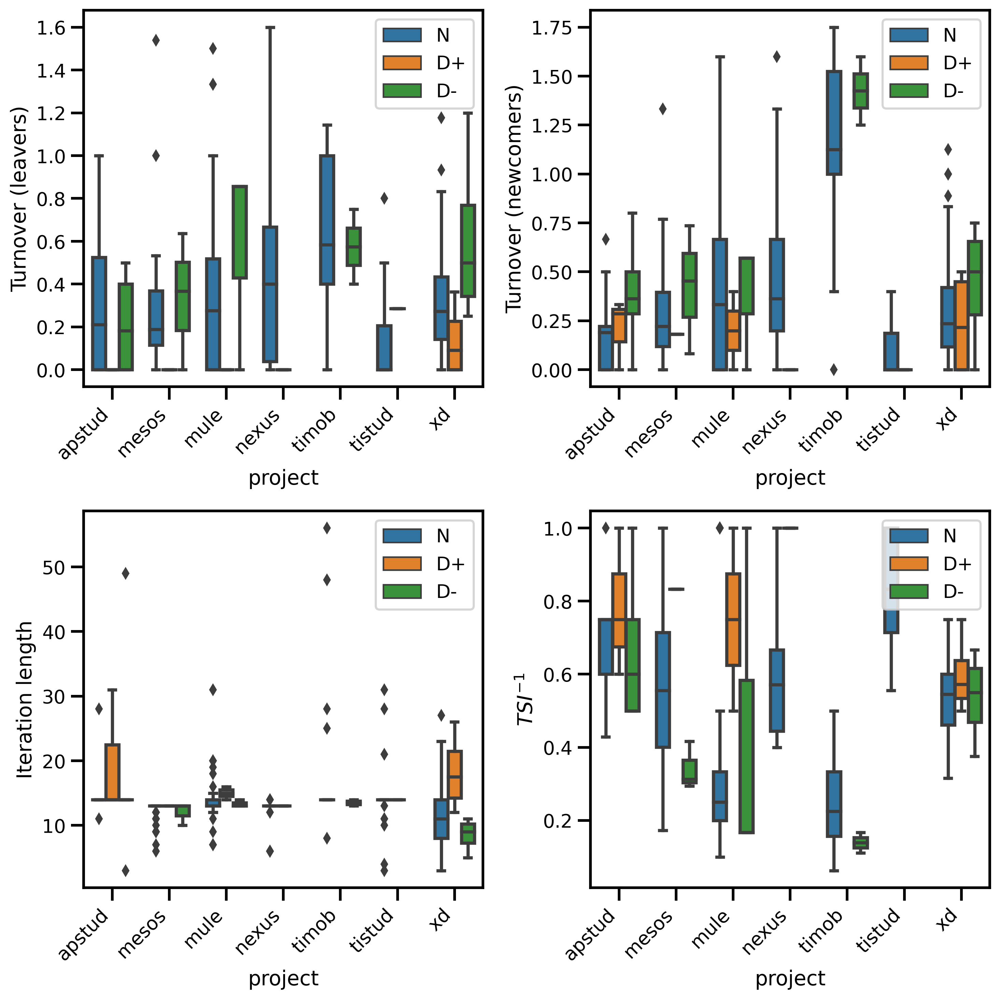

In [32]:
import seaborn as sns

fig = plt.figure(figsize=(10,10), dpi=300)

i=0
y_labels = ['Turnover (leavers)', 'Turnover (newcomers)', 'Iteration length', '${TSI}^{-1}$']
for m in ['turnover', 'new_devs', 'sprint_length', 'TSI_inv']:
    i = i + 1
    ax = fig.add_subplot(2, 2, i)
    sns.boxplot(x='project', y=m, hue='zone_velocity', hue_order=['N', 'D+', 'D-'], data=df, ax=ax, width=0.7)
    
    plt.xticks(rotation=45, ha='right')
    
    ax.set_ylabel(y_labels[i-1])
    
    #ax.get_legend().remove()
    ax.legend(loc='upper right')

plt.tight_layout()
plt.savefig('img/factors_zones_velocity.png')

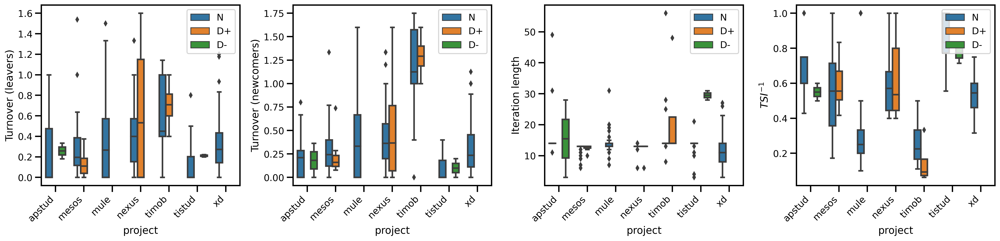

In [33]:
import seaborn as sns

fig = plt.figure(figsize=(20,5), dpi=300)

i=0
y_labels = ['Turnover (leavers)', 'Turnover (newcomers)', 'Iteration length', '${TSI}^{-1}$']
for m in ['turnover', 'new_devs', 'sprint_length', 'TSI_inv']:
    i = i + 1
    ax = fig.add_subplot(1, 4, i)
    sns.boxplot(x='project', y=m, hue='zone_focusfactor',  hue_order=['N', 'D+', 'D-'], data=df, ax=ax, width=0.7)
    
    plt.xticks(rotation=45, ha='right')
    
    ax.set_ylabel(y_labels[i-1])
    
    #ax.get_legend().remove()
    ax.legend(loc='upper right')

plt.tight_layout()
plt.savefig('img/factors_zones_focusfactor.png')

# Aggregated results

In [68]:
datax = pd.melt(df, id_vars=['sprint.name','zone_velocity', 'zone_focusfactor'], value_vars= ['turnover', 'new_devs', 'TSI', 'TSI_inv', 'sprint_length'], var_name='factor', value_name='factor_value')

In [69]:
datax2 = pd.melt(datax, id_vars=['sprint.name', 'factor', 'factor_value'] , value_vars=['zone_velocity', 'zone_focusfactor'] )

In [70]:
datax2['variable'].replace({ 'zone_velocity' : 'Velocity', 'zone_focusfactor' : 'Focus factor'}, inplace=True)

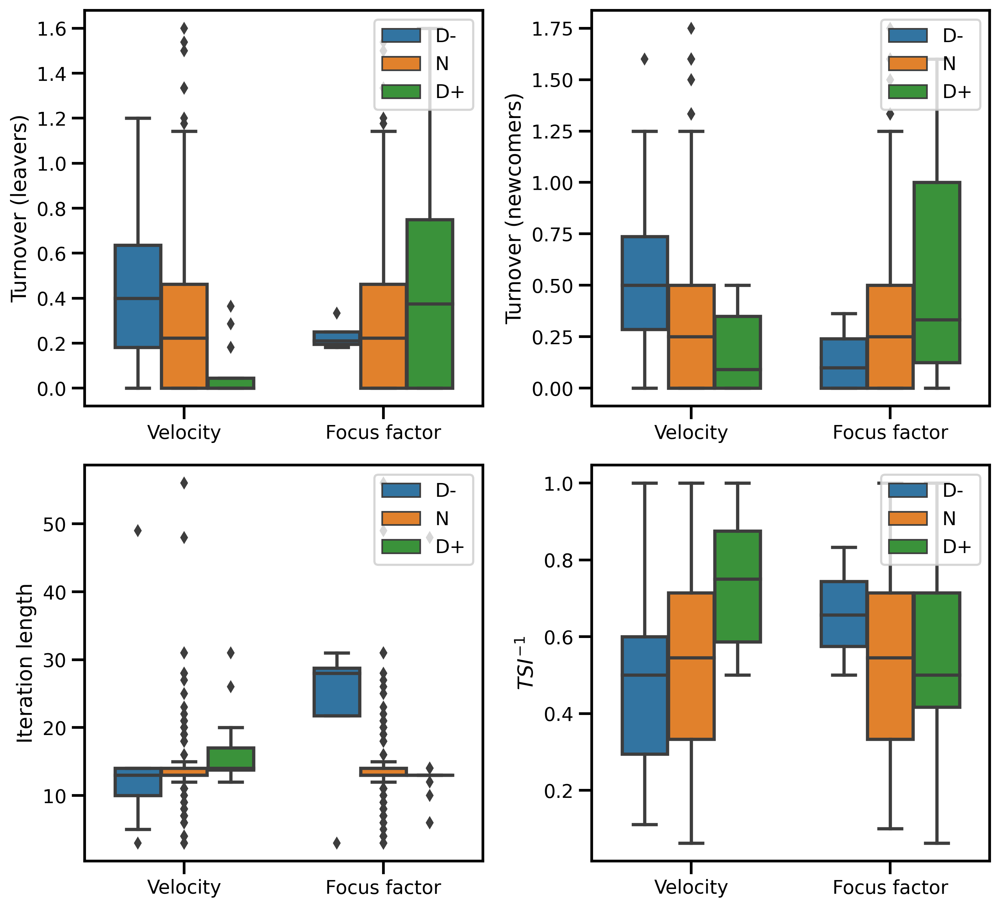

In [71]:
import seaborn as sns

fig = plt.figure(figsize=(10,9), dpi=300)

i=0
y_labels = ['Turnover (leavers)', 'Turnover (newcomers)', 'Iteration length', '${TSI}^{-1}$']
for m in ['turnover', 'new_devs', 'sprint_length', 'TSI_inv']:
    i = i + 1
    ax = fig.add_subplot(2, 2, i)
    sns.boxplot(x='variable', y='factor_value', hue='value',  hue_order=['D-', 'N', 'D+'], data=datax2[datax2['factor'] == m], ax=ax, width=0.7)
    
    ax.set_ylabel(y_labels[i-1])
    ax.legend(loc='upper right', frameon=True)
    ax.set_xlabel('')
    
plt.tight_layout()
plt.savefig('img/agg_factors_zones.pdf')